**Necessary Setup and Imports**

In [ ]:
pip install --upgrade super-gradients

  Using cached super_gradients-3.4.0-py3-none-any.whl (12.0 MB)
  Using cached boto3-1.28.80-py3-none-any.whl (135 kB)
  Using cached Deprecated-1.2.14-py2.py3-none-any.whl (9.6 kB)
  Using cached coverage-5.3.1-cp310-cp310-linux_x86_64.whl
  Using cached Sphinx-4.0.3-py3-none-any.whl (2.9 MB)
  Using cached sphinx_rtd_theme-1.3.0-py2.py3-none-any.whl (2.8 MB)
  Using cached torchmetrics-0.8.0-py3-none-any.whl (408 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl (154 kB)
  Using cached omegaconf-2.3.0-py3-none-any.whl (79 kB)
  Using cached onnxruntime-1.13.1-cp310-cp310-manylinux_2_27_x86_64.whl (4.5 MB)
  Using cached onnx-1.13.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.5 MB)
  Using cached pyparsing-2.4.5-py2.py3-none-any.whl (67 kB)
  Using cached einops-0.3.2-py3-none-any.whl (25 kB)
  Using cached pycocotools-2.0.6-cp310-cp310-linux_x86_64.whl
  Using cached treelib-1.6.1-py3-none-any.whl
  Using cached termcolor-1.1.0-py3-none-any.whl
  Using cached st

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training import models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import (
    DetectionMetrics_050,
    DetectionMetrics_050_095
)
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
import random

ModuleNotFoundError: ignored

**Dataset Set Up**

In [ ]:
ROOT_DIR = '/content/drive/MyDrive/yolo-nas' #change only this path according to the location of the folder on your own drive, rest will remain the same
train_imgs_dir = 'train/images/'
train_labels_dir = 'train/labels/'
val_imgs_dir = 'val/images/'
val_labels_dir = 'val/labels/'
test_imgs_dir = 'test/images/'
test_labels_dir = 'test/labels/'
classes = ['Phantom'] # name of the class
dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'test_labels_dir':test_labels_dir,
    'classes': classes
}

In [ ]:
# Global parameters.

# for yolo_nas_s keep the same params
EPOCHS = 15
BATCH_SIZE = 8
WORKERS = 2

# # for yolo_nas_s keep the same params
# EPOCHS = 30
# BATCH_SIZE = 8
# WORKERS = 2


# keep on decreasing the number for each param and run the model until it trains completely without any crash
# then use those params for yolo_nas_l model and repeat the same.
# the idea is to find out the ideal numbers for EPOCHS, BATCH_SIZE and WORKERS on which the model is able to run smoothly.


**Visualize Ground Truth Images**

In [ ]:
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))

        class_name = classes[int(labels[box_num])]

        color=colors[classes.index(class_name)]

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=lw,
            lineType=cv2.LINE_AA
        )

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name,
            0,
            fontScale=lw / 3,
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=-1,
            lineType=cv2.LINE_AA
        )
        cv2.putText(
            image,
            class_name,
            (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
            cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=lw/3.5,
            color=(255, 255, 255),
            thickness=tf,
            lineType=cv2.LINE_AA
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()

    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)

    num_images = len(all_training_images)

    if num_samples == -1:
        num_samples = num_images

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

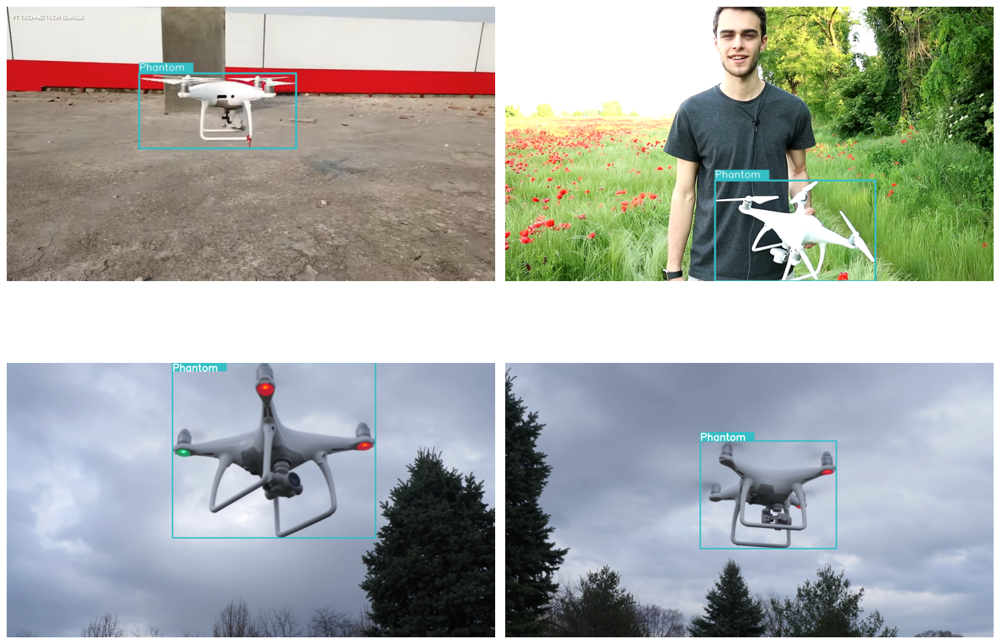

In [ ]:
# Visualize a few training images.
plot(
    image_path=os.path.join(ROOT_DIR, train_imgs_dir),
    label_path=os.path.join(ROOT_DIR, train_labels_dir),
    num_samples=4,
)

**Data Preparation**

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':BATCH_SIZE,
        'num_workers':WORKERS
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':BATCH_SIZE,
        'num_workers':WORKERS
    }
)

[2023-11-07 21:24:25] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 240/240 [00:00<00:00, 434.21it/s]
[2023-11-07 21:24:26] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 80/80 [00:00<00:00, 214.93it/s]


**Transforms and Augmentations**

In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

In [ ]:
train_data.dataset.transforms.pop(2)

DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114)

/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)


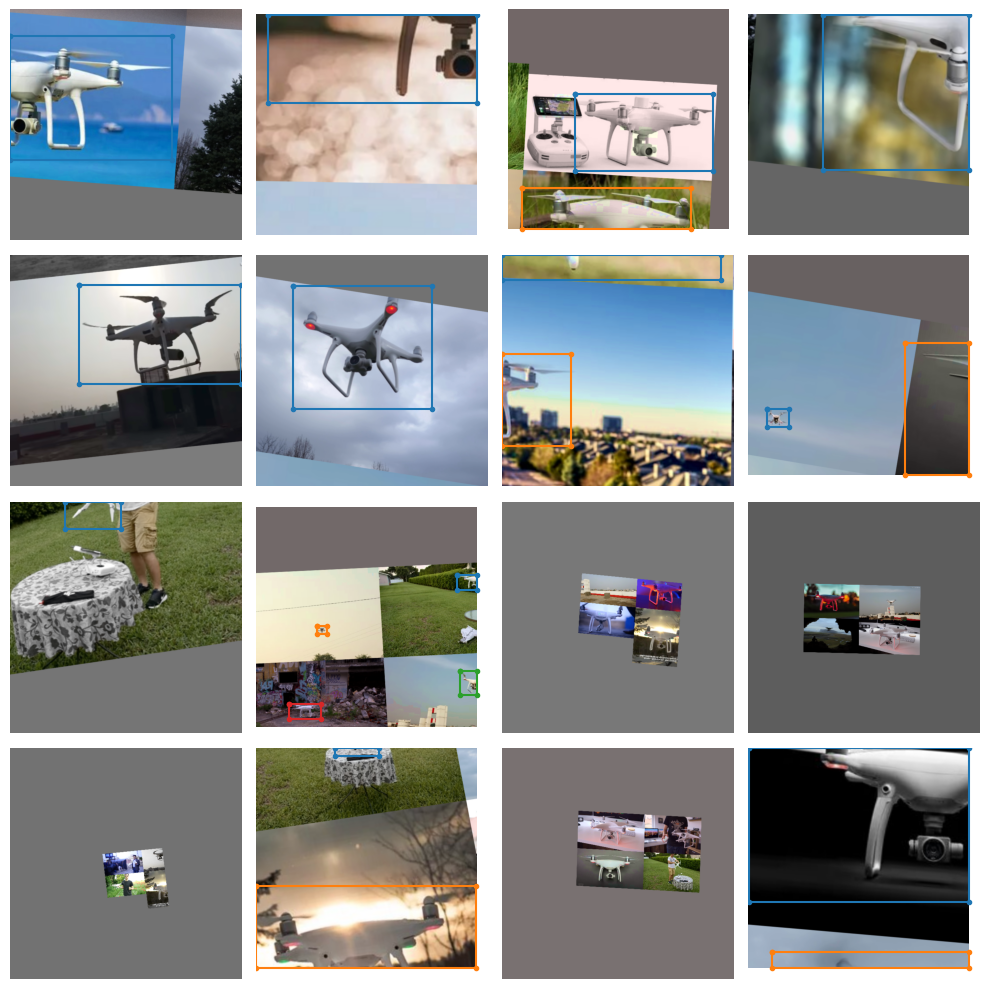

In [ ]:
train_data.dataset.plot(plot_transformed_data=True)


**Prepare Model and Training Parameters**

In [ ]:
train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        ),
        DetectionMetrics_050_095(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50:0.95'
}

In [ ]:
models_to_train = ['yolo_nas_l'] #use only one model name here out of all the three models i.e. yolo_nas_s, yolo_nas_m, yolo_nas_l

In [ ]:
CHECKPOINT_DIR = 'checkpoints'

**Model Training**

In [ ]:
for model_to_train in models_to_train:
    trainer = Trainer(
        experiment_name=model_to_train,
        ckpt_root_dir=CHECKPOINT_DIR
    )

    model = models.get(
        model_to_train,
        pretrained_weights="coco"
    )
    trainer.train(
        model=model,
        training_params=train_params,
        train_loader=train_data,
        valid_loader=val_data
    )

[2023-11-07 21:24:58] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-11-07 21:24:59] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2023-11-07 21:25:08] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231107_212508_128396`
[2023-11-07 21:25:08] INFO - sg_trainer.py - Checkpoints directory: checkpoints/yolo_nas_l/RUN_20231107_212508_128396
[2023-11-07 21:25:08] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn

The console stream is now moved to checkpoints/yolo_nas_l/RUN_20231107_212508_128396/console_Nov07_21_25_08.txt


/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
[2023-11-07 21:25:12] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            240        (len(train_set))
    - Batch size per GPU:           8  

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.1688
│   ├── Ppyoloeloss/loss_iou = 0.63
│   ├── Ppyoloeloss/loss_dfl = 0.7637
│   └── Ppyoloeloss/loss = 3.5625
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8288
    ├── Ppyoloeloss/loss_iou = 0.2366
    ├── Ppyoloeloss/loss_dfl = 0.3979
    ├── Ppyoloeloss/loss = 2.4632
    ├── Precision@0.50 = 0.0451
    ├── Recall@0.50 = 0.5875
    ├── Map@0.50 = 0.2156
    ├── F1@0.50 = 0.0838
    ├── Precision@0.50:0.95 = 0.0364
    ├── Recall@0.50:0.95 = 0.4737
    ├── Map@0.50:0.95 = 0.1141
    └── F1@0.50:0.95 = 0.0677



Train epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 1:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2218
│   │   ├── Epoch N-1      = 2.1688 (↘ -0.947)
│   │   └── Best until now = 2.1688 (↘ -0.947)
│   ├── Ppyoloeloss/loss_iou = 0.4583
│   │   ├── Epoch N-1      = 0.63   (↘ -0.1717)
│   │   └── Best until now = 0.63   (↘ -0.1717)
│   ├── Ppyoloeloss/loss_dfl = 0.6331
│   │   ├── Epoch N-1      = 0.7637 (↘ -0.1306)
│   │   └── Best until now = 0.7637 (↘ -0.1306)
│   └── Ppyoloeloss/loss = 2.3132
│       ├── Epoch N-1      = 3.5625 (↘ -1.2493)
│       └── Best until now = 3.5625 (↘ -1.2493)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9912
    │   ├── Epoch N-1      = 1.8288 (↘ -0.8376)
    │   └── Best until now = 1.8288 (↘ -0.8376)
    ├── Ppyoloeloss/loss_iou = 0.5125
    │   ├── Epoch N-1      = 0.2366 (↗ 0.2759)
    │   └── Best until now = 0.2366 (↗ 0.2759)
    ├── Ppyoloeloss/loss_dfl = 0.6911
    │   ├── Epoch N-1      = 0.3979 (↗ 0.2932)
    │   └── Best until now = 0.3979 (↗ 0.2932)
    ├── Ppyoloeloss/loss = 2

Train epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 2:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0137
│   │   ├── Epoch N-1      = 1.2218 (↘ -0.2081)
│   │   └── Best until now = 1.2218 (↘ -0.2081)
│   ├── Ppyoloeloss/loss_iou = 0.5298
│   │   ├── Epoch N-1      = 0.4583 (↗ 0.0715)
│   │   └── Best until now = 0.4583 (↗ 0.0715)
│   ├── Ppyoloeloss/loss_dfl = 0.6979
│   │   ├── Epoch N-1      = 0.6331 (↗ 0.0648)
│   │   └── Best until now = 0.6331 (↗ 0.0648)
│   └── Ppyoloeloss/loss = 2.2414
│       ├── Epoch N-1      = 2.3132 (↘ -0.0718)
│       └── Best until now = 2.3132 (↘ -0.0718)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9851
    │   ├── Epoch N-1      = 0.9912 (↘ -0.0061)
    │   └── Best until now = 0.9912 (↘ -0.0061)
    ├── Ppyoloeloss/loss_iou = 0.4307
    │   ├── Epoch N-1      = 0.5125 (↘ -0.0818)
    │   └── Best until now = 0.2366 (↗ 0.1941)
    ├── Ppyoloeloss/loss_dfl = 0.5994
    │   ├── Epoch N-1      = 0.6911 (↘ -0.0918)
    │   └── Best until now = 0.3979 (↗ 0.2015)
    ├── Ppyoloeloss/loss = 2

Train epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 3:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.017
│   │   ├── Epoch N-1      = 1.0137 (↗ 0.0033)
│   │   └── Best until now = 1.0137 (↗ 0.0033)
│   ├── Ppyoloeloss/loss_iou = 0.526
│   │   ├── Epoch N-1      = 0.5298 (↘ -0.0039)
│   │   └── Best until now = 0.4583 (↗ 0.0677)
│   ├── Ppyoloeloss/loss_dfl = 0.6915
│   │   ├── Epoch N-1      = 0.6979 (↘ -0.0063)
│   │   └── Best until now = 0.6331 (↗ 0.0585)
│   └── Ppyoloeloss/loss = 2.2345
│       ├── Epoch N-1      = 2.2414 (↘ -0.0069)
│       └── Best until now = 2.2414 (↘ -0.0069)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9167
    │   ├── Epoch N-1      = 0.9851 (↘ -0.0684)
    │   └── Best until now = 0.9851 (↘ -0.0684)
    ├── Ppyoloeloss/loss_iou = 0.4795
    │   ├── Epoch N-1      = 0.4307 (↗ 0.0488)
    │   └── Best until now = 0.2366 (↗ 0.243)
    ├── Ppyoloeloss/loss_dfl = 0.6872
    │   ├── Epoch N-1      = 0.5994 (↗ 0.0878)
    │   └── Best until now = 0.3979 (↗ 0.2892)
    ├── Ppyoloeloss/loss = 2.0834

Train epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 4:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.034
│   │   ├── Epoch N-1      = 1.017  (↗ 0.017)
│   │   └── Best until now = 1.0137 (↗ 0.0203)
│   ├── Ppyoloeloss/loss_iou = 0.5326
│   │   ├── Epoch N-1      = 0.526  (↗ 0.0066)
│   │   └── Best until now = 0.4583 (↗ 0.0743)
│   ├── Ppyoloeloss/loss_dfl = 0.7075
│   │   ├── Epoch N-1      = 0.6915 (↗ 0.016)
│   │   └── Best until now = 0.6331 (↗ 0.0745)
│   └── Ppyoloeloss/loss = 2.2741
│       ├── Epoch N-1      = 2.2345 (↗ 0.0396)
│       └── Best until now = 2.2345 (↗ 0.0396)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8531
    │   ├── Epoch N-1      = 0.9167 (↘ -0.0636)
    │   └── Best until now = 0.9167 (↘ -0.0636)
    ├── Ppyoloeloss/loss_iou = 0.3831
    │   ├── Epoch N-1      = 0.4795 (↘ -0.0964)
    │   └── Best until now = 0.2366 (↗ 0.1465)
    ├── Ppyoloeloss/loss_dfl = 0.5463
    │   ├── Epoch N-1      = 0.6872 (↘ -0.1409)
    │   └── Best until now = 0.3979 (↗ 0.1484)
    ├── Ppyoloeloss/loss = 1.7825
 

Train epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 5:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0454
│   │   ├── Epoch N-1      = 1.034  (↗ 0.0113)
│   │   └── Best until now = 1.0137 (↗ 0.0316)
│   ├── Ppyoloeloss/loss_iou = 0.538
│   │   ├── Epoch N-1      = 0.5326 (↗ 0.0054)
│   │   └── Best until now = 0.4583 (↗ 0.0797)
│   ├── Ppyoloeloss/loss_dfl = 0.6771
│   │   ├── Epoch N-1      = 0.7075 (↘ -0.0304)
│   │   └── Best until now = 0.6331 (↗ 0.044)
│   └── Ppyoloeloss/loss = 2.2605
│       ├── Epoch N-1      = 2.2741 (↘ -0.0137)
│       └── Best until now = 2.2345 (↗ 0.0259)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9264
    │   ├── Epoch N-1      = 0.8531 (↗ 0.0733)
    │   └── Best until now = 0.8531 (↗ 0.0733)
    ├── Ppyoloeloss/loss_iou = 0.5135
    │   ├── Epoch N-1      = 0.3831 (↗ 0.1304)
    │   └── Best until now = 0.2366 (↗ 0.2769)
    ├── Ppyoloeloss/loss_dfl = 0.6181
    │   ├── Epoch N-1      = 0.5463 (↗ 0.0718)
    │   └── Best until now = 0.3979 (↗ 0.2202)
    ├── Ppyoloeloss/loss = 2.058
   

Train epoch 6:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 6:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 6:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9842
│   │   ├── Epoch N-1      = 1.0454 (↘ -0.0611)
│   │   └── Best until now = 1.0137 (↘ -0.0295)
│   ├── Ppyoloeloss/loss_iou = 0.5017
│   │   ├── Epoch N-1      = 0.538  (↘ -0.0363)
│   │   └── Best until now = 0.4583 (↗ 0.0433)
│   ├── Ppyoloeloss/loss_dfl = 0.6618
│   │   ├── Epoch N-1      = 0.6771 (↘ -0.0154)
│   │   └── Best until now = 0.6331 (↗ 0.0287)
│   └── Ppyoloeloss/loss = 2.1477
│       ├── Epoch N-1      = 2.2605 (↘ -0.1128)
│       └── Best until now = 2.2345 (↘ -0.0869)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.824
    │   ├── Epoch N-1      = 0.9264 (↘ -0.1024)
    │   └── Best until now = 0.8531 (↘ -0.0291)
    ├── Ppyoloeloss/loss_iou = 0.4255
    │   ├── Epoch N-1      = 0.5135 (↘ -0.088)
    │   └── Best until now = 0.2366 (↗ 0.1889)
    ├── Ppyoloeloss/loss_dfl = 0.5681
    │   ├── Epoch N-1      = 0.6181 (↘ -0.05)
    │   └── Best until now = 0.3979 (↗ 0.1702)
    ├── Ppyoloeloss/loss = 1.8

Train epoch 7:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 7:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 7:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0637
│   │   ├── Epoch N-1      = 0.9842 (↗ 0.0794)
│   │   └── Best until now = 0.9842 (↗ 0.0794)
│   ├── Ppyoloeloss/loss_iou = 0.4983
│   │   ├── Epoch N-1      = 0.5017 (↘ -0.0034)
│   │   └── Best until now = 0.4583 (↗ 0.04)
│   ├── Ppyoloeloss/loss_dfl = 0.6788
│   │   ├── Epoch N-1      = 0.6618 (↗ 0.0171)
│   │   └── Best until now = 0.6331 (↗ 0.0458)
│   └── Ppyoloeloss/loss = 2.2408
│       ├── Epoch N-1      = 2.1477 (↗ 0.0932)
│       └── Best until now = 2.1477 (↗ 0.0932)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9383
    │   ├── Epoch N-1      = 0.824  (↗ 0.1142)
    │   └── Best until now = 0.824  (↗ 0.1142)
    ├── Ppyoloeloss/loss_iou = 0.4489
    │   ├── Epoch N-1      = 0.4255 (↗ 0.0235)
    │   └── Best until now = 0.2366 (↗ 0.2124)
    ├── Ppyoloeloss/loss_dfl = 0.5832
    │   ├── Epoch N-1      = 0.5681 (↗ 0.0151)
    │   └── Best until now = 0.3979 (↗ 0.1852)
    ├── Ppyoloeloss/loss = 1.9704
   

Train epoch 8:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 8:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 8:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0018
│   │   ├── Epoch N-1      = 1.0637 (↘ -0.0619)
│   │   └── Best until now = 0.9842 (↗ 0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.4849
│   │   ├── Epoch N-1      = 0.4983 (↘ -0.0134)
│   │   └── Best until now = 0.4583 (↗ 0.0266)
│   ├── Ppyoloeloss/loss_dfl = 0.6684
│   │   ├── Epoch N-1      = 0.6788 (↘ -0.0104)
│   │   └── Best until now = 0.6331 (↗ 0.0353)
│   └── Ppyoloeloss/loss = 2.1551
│       ├── Epoch N-1      = 2.2408 (↘ -0.0857)
│       └── Best until now = 2.1477 (↗ 0.0074)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7381
    │   ├── Epoch N-1      = 0.9383 (↘ -0.2002)
    │   └── Best until now = 0.824  (↘ -0.0859)
    ├── Ppyoloeloss/loss_iou = 0.4025
    │   ├── Epoch N-1      = 0.4489 (↘ -0.0464)
    │   └── Best until now = 0.2366 (↗ 0.166)
    ├── Ppyoloeloss/loss_dfl = 0.5338
    │   ├── Epoch N-1      = 0.5832 (↘ -0.0494)
    │   └── Best until now = 0.3979 (↗ 0.1359)
    ├── Ppyoloeloss/loss = 1.

Train epoch 9:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 9:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 9:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested s

SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.875
│   │   ├── Epoch N-1      = 1.0018 (↘ -0.1267)
│   │   └── Best until now = 0.9842 (↘ -0.1092)
│   ├── Ppyoloeloss/loss_iou = 0.4456
│   │   ├── Epoch N-1      = 0.4849 (↘ -0.0393)
│   │   └── Best until now = 0.4583 (↘ -0.0127)
│   ├── Ppyoloeloss/loss_dfl = 0.6099
│   │   ├── Epoch N-1      = 0.6684 (↘ -0.0585)
│   │   └── Best until now = 0.6331 (↘ -0.0231)
│   └── Ppyoloeloss/loss = 1.9305
│       ├── Epoch N-1      = 2.1551 (↘ -0.2246)
│       └── Best until now = 2.1477 (↘ -0.2171)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6807
    │   ├── Epoch N-1      = 0.7381 (↘ -0.0574)
    │   └── Best until now = 0.7381 (↘ -0.0574)
    ├── Ppyoloeloss/loss_iou = 0.3955
    │   ├── Epoch N-1      = 0.4025 (↘ -0.0071)
    │   └── Best until now = 0.2366 (↗ 0.1589)
    ├── Ppyoloeloss/loss_dfl = 0.5413
    │   ├── Epoch N-1      = 0.5338 (↗ 0.0075)
    │   └── Best until now = 0.3979 (↗ 0.1434)
    ├── Ppyoloeloss/loss =

Train epoch 10:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 10:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 10:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged neste

SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8366
│   │   ├── Epoch N-1      = 0.875  (↘ -0.0384)
│   │   └── Best until now = 0.875  (↘ -0.0384)
│   ├── Ppyoloeloss/loss_iou = 0.4087
│   │   ├── Epoch N-1      = 0.4456 (↘ -0.0368)
│   │   └── Best until now = 0.4456 (↘ -0.0368)
│   ├── Ppyoloeloss/loss_dfl = 0.5767
│   │   ├── Epoch N-1      = 0.6099 (↘ -0.0333)
│   │   └── Best until now = 0.6099 (↘ -0.0333)
│   └── Ppyoloeloss/loss = 1.8219
│       ├── Epoch N-1      = 1.9305 (↘ -0.1086)
│       └── Best until now = 1.9305 (↘ -0.1086)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6562
    │   ├── Epoch N-1      = 0.6807 (↘ -0.0245)
    │   └── Best until now = 0.6807 (↘ -0.0245)
    ├── Ppyoloeloss/loss_iou = 0.3759
    │   ├── Epoch N-1      = 0.3955 (↘ -0.0196)
    │   └── Best until now = 0.2366 (↗ 0.1393)
    ├── Ppyoloeloss/loss_dfl = 0.5017
    │   ├── Epoch N-1      = 0.5413 (↘ -0.0396)
    │   └── Best until now = 0.3979 (↗ 0.1038)
    ├── Ppyoloeloss/los

Train epoch 11:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 11:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 11:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged neste

SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8044
│   │   ├── Epoch N-1      = 0.8366 (↘ -0.0322)
│   │   └── Best until now = 0.8366 (↘ -0.0322)
│   ├── Ppyoloeloss/loss_iou = 0.4226
│   │   ├── Epoch N-1      = 0.4087 (↗ 0.0139)
│   │   └── Best until now = 0.4087 (↗ 0.0139)
│   ├── Ppyoloeloss/loss_dfl = 0.5968
│   │   ├── Epoch N-1      = 0.5767 (↗ 0.0201)
│   │   └── Best until now = 0.5767 (↗ 0.0201)
│   └── Ppyoloeloss/loss = 1.8238
│       ├── Epoch N-1      = 1.8219 (↗ 0.0018)
│       └── Best until now = 1.8219 (↗ 0.0018)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6552
    │   ├── Epoch N-1      = 0.6562 (↘ -0.0009)
    │   └── Best until now = 0.6562 (↘ -0.0009)
    ├── Ppyoloeloss/loss_iou = 0.3913
    │   ├── Epoch N-1      = 0.3759 (↗ 0.0154)
    │   └── Best until now = 0.2366 (↗ 0.1547)
    ├── Ppyoloeloss/loss_dfl = 0.5105
    │   ├── Epoch N-1      = 0.5017 (↗ 0.0088)
    │   └── Best until now = 0.3979 (↗ 0.1126)
    ├── Ppyoloeloss/loss = 1.55

Train epoch 12:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 12:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 12:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged neste

SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7853
│   │   ├── Epoch N-1      = 0.8044 (↘ -0.0191)
│   │   └── Best until now = 0.8044 (↘ -0.0191)
│   ├── Ppyoloeloss/loss_iou = 0.3819
│   │   ├── Epoch N-1      = 0.4226 (↘ -0.0408)
│   │   └── Best until now = 0.4087 (↘ -0.0269)
│   ├── Ppyoloeloss/loss_dfl = 0.5471
│   │   ├── Epoch N-1      = 0.5968 (↘ -0.0497)
│   │   └── Best until now = 0.5767 (↘ -0.0296)
│   └── Ppyoloeloss/loss = 1.7143
│       ├── Epoch N-1      = 1.8238 (↘ -0.1095)
│       └── Best until now = 1.8219 (↘ -0.1077)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6316
    │   ├── Epoch N-1      = 0.6552 (↘ -0.0236)
    │   └── Best until now = 0.6552 (↘ -0.0236)
    ├── Ppyoloeloss/loss_iou = 0.3817
    │   ├── Epoch N-1      = 0.3913 (↘ -0.0096)
    │   └── Best until now = 0.2366 (↗ 0.1451)
    ├── Ppyoloeloss/loss_dfl = 0.5052
    │   ├── Epoch N-1      = 0.5105 (↘ -0.0053)
    │   └── Best until now = 0.3979 (↗ 0.1073)
    ├── Ppyoloeloss/los

Train epoch 13:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 13:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 13:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged neste

SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8077
│   │   ├── Epoch N-1      = 0.7853 (↗ 0.0224)
│   │   └── Best until now = 0.7853 (↗ 0.0224)
│   ├── Ppyoloeloss/loss_iou = 0.3866
│   │   ├── Epoch N-1      = 0.3819 (↗ 0.0047)
│   │   └── Best until now = 0.3819 (↗ 0.0047)
│   ├── Ppyoloeloss/loss_dfl = 0.5568
│   │   ├── Epoch N-1      = 0.5471 (↗ 0.0097)
│   │   └── Best until now = 0.5471 (↗ 0.0097)
│   └── Ppyoloeloss/loss = 1.7511
│       ├── Epoch N-1      = 1.7143 (↗ 0.0368)
│       └── Best until now = 1.7143 (↗ 0.0368)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6126
    │   ├── Epoch N-1      = 0.6316 (↘ -0.019)
    │   └── Best until now = 0.6316 (↘ -0.019)
    ├── Ppyoloeloss/loss_iou = 0.3553
    │   ├── Epoch N-1      = 0.3817 (↘ -0.0264)
    │   └── Best until now = 0.2366 (↗ 0.1188)
    ├── Ppyoloeloss/loss_dfl = 0.4754
    │   ├── Epoch N-1      = 0.5052 (↘ -0.0298)
    │   └── Best until now = 0.3979 (↗ 0.0774)
    ├── Ppyoloeloss/loss = 1.4433

Train epoch 14:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Train epoch 14:   0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 14:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged neste

SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7845
│   │   ├── Epoch N-1      = 0.8077 (↘ -0.0232)
│   │   └── Best until now = 0.7853 (↘ -0.0008)
│   ├── Ppyoloeloss/loss_iou = 0.3763
│   │   ├── Epoch N-1      = 0.3866 (↘ -0.0103)
│   │   └── Best until now = 0.3819 (↘ -0.0056)
│   ├── Ppyoloeloss/loss_dfl = 0.5462
│   │   ├── Epoch N-1      = 0.5568 (↘ -0.0106)
│   │   └── Best until now = 0.5471 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 1.707
│       ├── Epoch N-1      = 1.7511 (↘ -0.0441)
│       └── Best until now = 1.7143 (↘ -0.0073)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6231
    │   ├── Epoch N-1      = 0.6126 (↗ 0.0105)
    │   └── Best until now = 0.6126 (↗ 0.0105)
    ├── Ppyoloeloss/loss_iou = 0.3883
    │   ├── Epoch N-1      = 0.3553 (↗ 0.0329)
    │   └── Best until now = 0.2366 (↗ 0.1517)
    ├── Ppyoloeloss/loss_dfl = 0.5049
    │   ├── Epoch N-1      = 0.4754 (↗ 0.0296)
    │   └── Best until now = 0.3979 (↗ 0.107)
    ├── Ppyoloeloss/loss = 1.

[2023-11-07 21:55:15] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 15:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 15:   0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
Validating epoch 15: 100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


# **If you are not able to train the model even after adjusting for epochs, batch and workers, then run the following code which includes saving and loading checkpoints:**

In [ ]:
pip install pytorch_lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.6/774.6 kB 9.3 MB/s eta 0:00:00


In [ ]:
import torch
import torch.optim as optim
from pytorch_lightning.callbacks import ModelCheckpoint

In [ ]:
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
# Save checkpoint
def save_checkpoint(epoch, model, optimizer, model_name, filename="checkpoint.pth.tar"):
    torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, os.path.join(CHECKPOINT_DIR, f'checkpoint_{model_name}.pth.tar'))

#Load Checkpoint
def load_checkpoint(model, optimizer, model_name, filename="checkpoint.pth.tar"):
    checkpoint = torch.load(os.path.join(CHECKPOINT_DIR, f'checkpoint_{model_name}.pth.tar'))
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    return epoch

In [ ]:
# Model Training Loop
for model_to_train in models_to_train:
    model = models.get(
        model_to_train,
        pretrained_weights="coco"
    )

    optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
    criterion = PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    )

    start_epoch = 0
    if os.path.exists(os.path.join(CHECKPOINT_DIR, f'checkpoint_{model_to_train}.pth.tar')):
        start_epoch = load_checkpoint(model, optimizer, model_to_train)
        print(f'Resuming training for {model_to_train} from epoch {start_epoch + 1}')

    for epoch in range(start_epoch, EPOCHS):
        model.train()
        total_loss = 0

        for batch in train_data:
            images, targets = batch  # Split the batch into images and targets
            optimizer.zero_grad()
            outputs = model(images)  # Pass images through the model
            loss = criterion(outputs, targets)  # Compute loss
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_data)

        print(f"Epoch {epoch+1}, Average Loss: {avg_loss}")

        if (epoch + 1) % 10 == 0:
            save_checkpoint(epoch, model, optimizer, model_to_train)

print("Training complete.")

[2023-11-06 19:48:44] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_m_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_m_coco.pth
100%|██████████| 196M/196M [00:03<00:00, 59.7MB/s]
[2023-11-06 19:48:49] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_m
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the work

AttributeError: ignored

# **Inference Code**

In [ ]:
import torch
import glob
import cv2
import matplotlib.pyplot as plt
import random
import os
from super_gradients.training import models
from tqdm.auto import tqdm

In [ ]:
os.makedirs('inference_results/images/', exist_ok=True)

In [ ]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
model = models.get(
    model_name=model_to_train,
    checkpoint_path='checkpoints/yolo_nas_l/RUN_20231107_212508_128396/ckpt_best.pth', #search for your correct path in the left pane
    num_classes=80
).to(device)

[2023-11-07 22:07:31] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints/yolo_nas_l/RUN_20231107_212508_128396/ckpt_best.pth EMA checkpoint.


**Inference on Test Images**

In [ ]:
ROOT_TEST = '/content/drive/MyDrive/yolo-nas/test/images' # complete path of your test images
all_images = os.listdir(ROOT_TEST)

In [ ]:
for image in tqdm(all_images, total=len(all_images)):
    image_path = os.path.join(ROOT_TEST, image)
    out = model.predict(image_path)
    out.save('inference_results/images')
    os.rename(
        'inference_results/images/pred_0.jpg',
        os.path.join('inference_results/images/', image)
    )

  0%|          | 0/80 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/numpy/lib/arraypad.py:487: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)
[2023-11-07 22:08:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/visualization/utils.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("gist_rainbow", num_classes)
[2023-11-07 22:08:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can 

**Overlapped Ground Truth Samples**

In [ ]:
classes = ['Phantom']

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))

        class_name = classes[int(labels[box_num])]

        color = (0, 0, 255)

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=lw,
            lineType=cv2.LINE_AA
        )

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name,
            0,
            fontScale=lw / 3,
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        new_p2 = p1[0] + w, p2[1] + h + 3 if outside else p2[1] - h - 3

        cv2.rectangle(
            image,
            (p1[0], p2[1]), new_p2,
            color=color,
            thickness=-1,
            lineType=cv2.LINE_AA
        )
        cv2.putText(
            image,
            class_name,
            (p1[0], p2[1] + h + 2 if outside else p2[1]),
            cv2.FONT_HERSHEY_SIMPLEX,
            fontScale=lw/3,
            color=(255, 255, 255),
            thickness=tf,
            lineType=cv2.LINE_AA
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()

    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)

    num_images = len(all_training_images)

    if num_samples == -1:
        num_samples = num_images

    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.figure(figsize=(12, 9))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

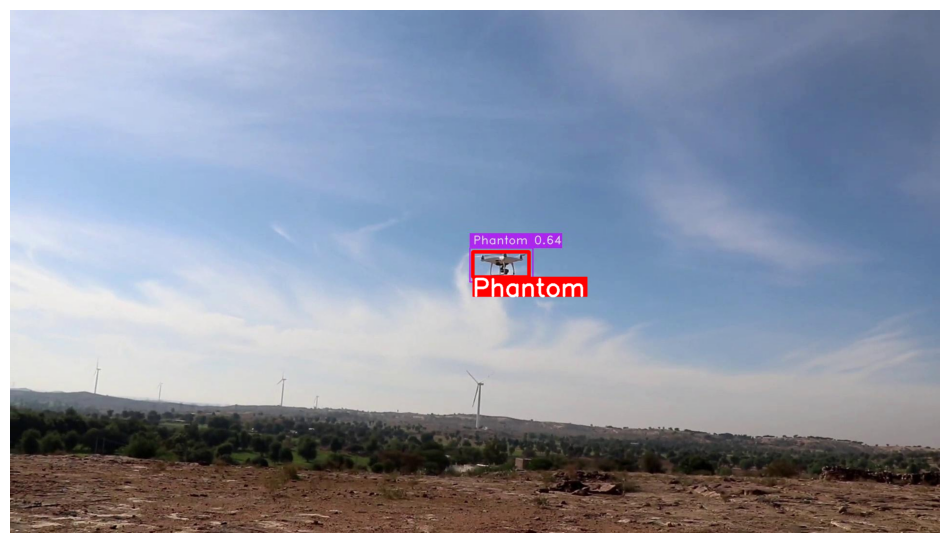

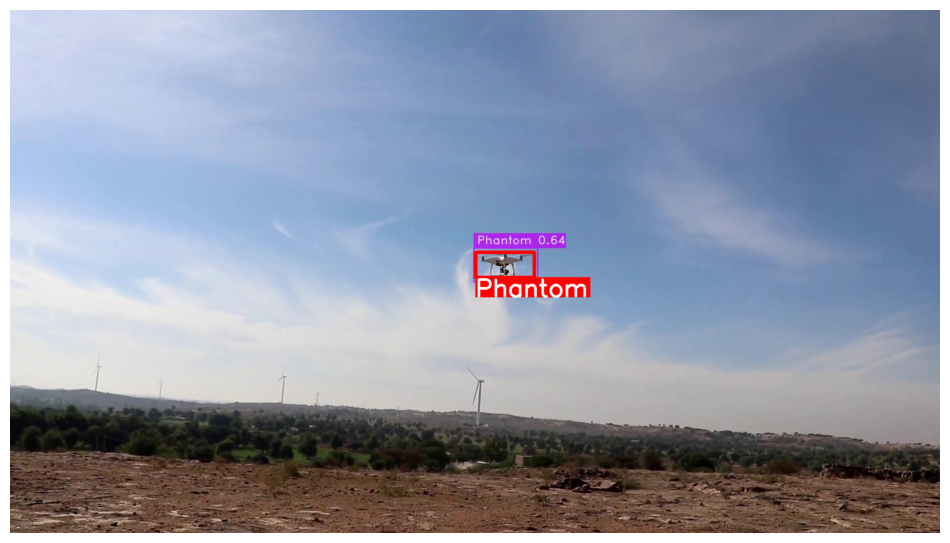

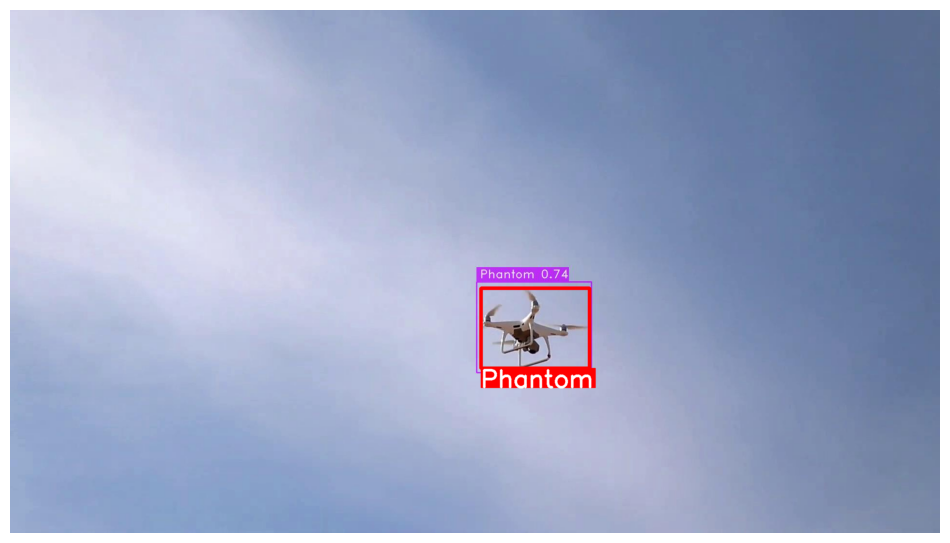

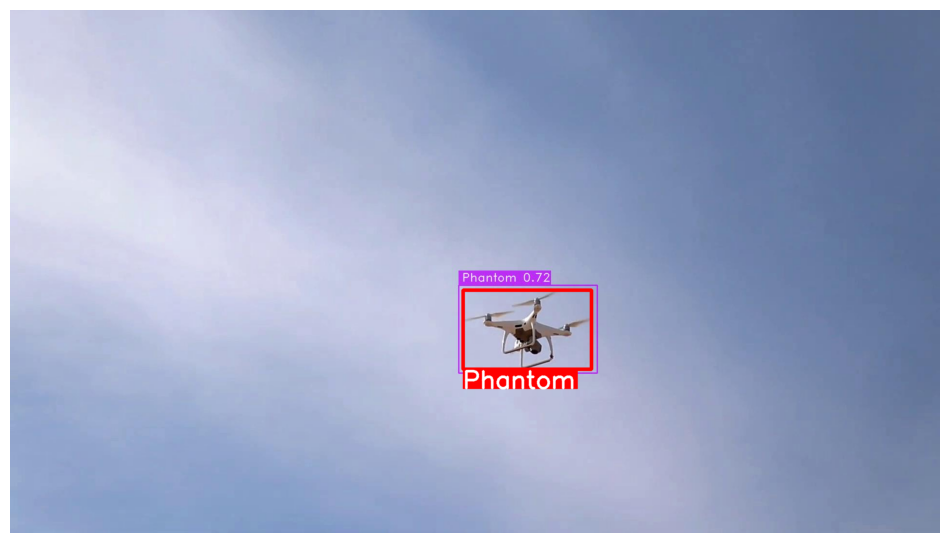

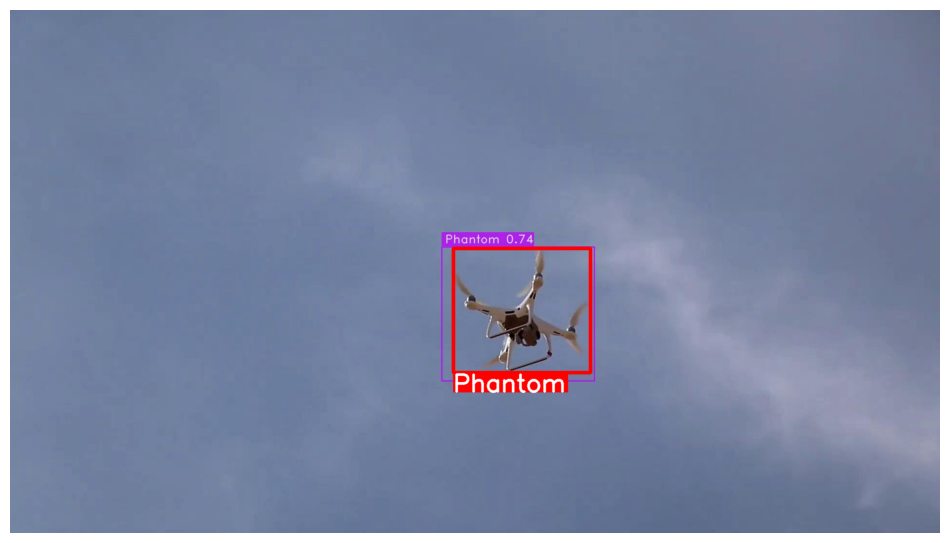

...

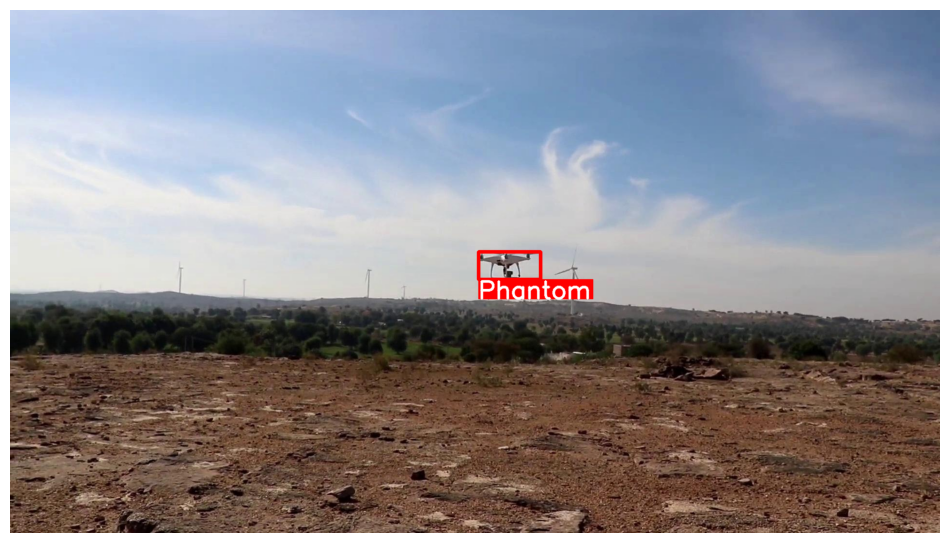

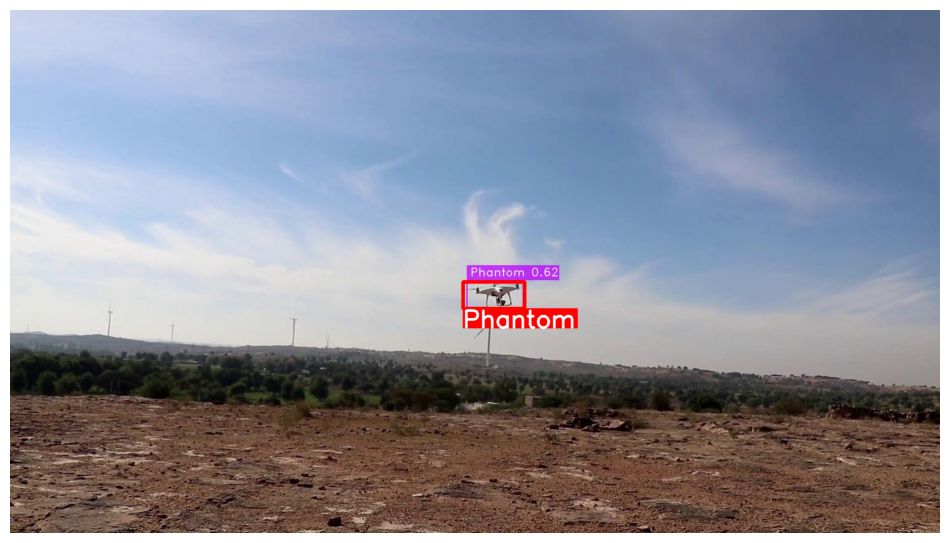

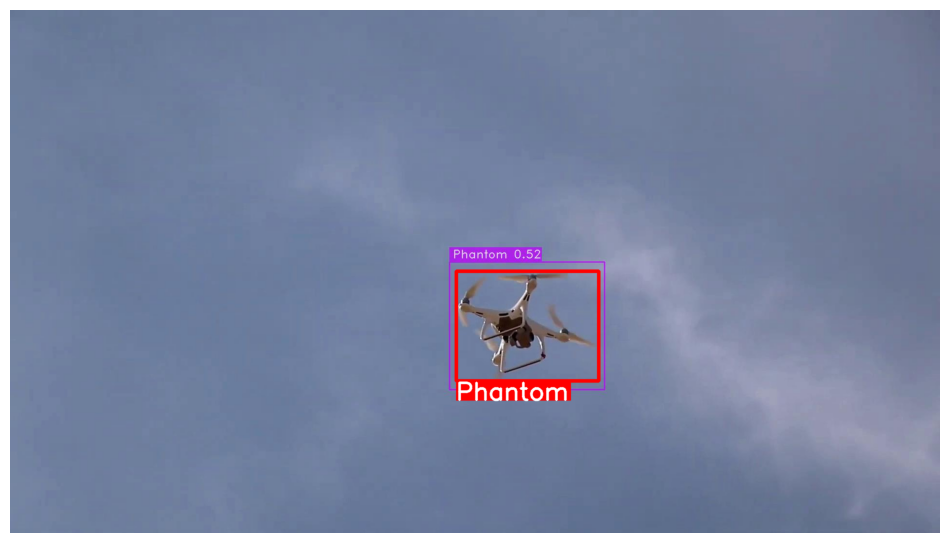

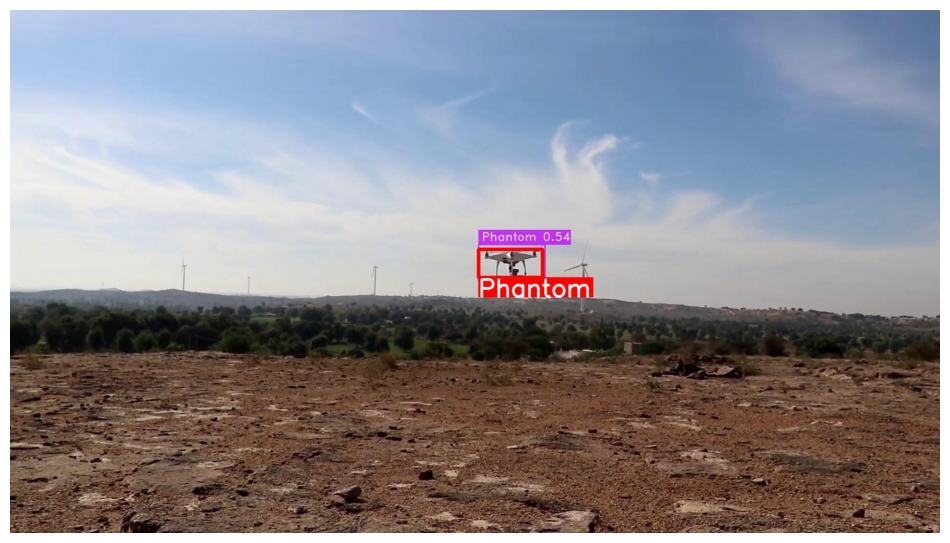

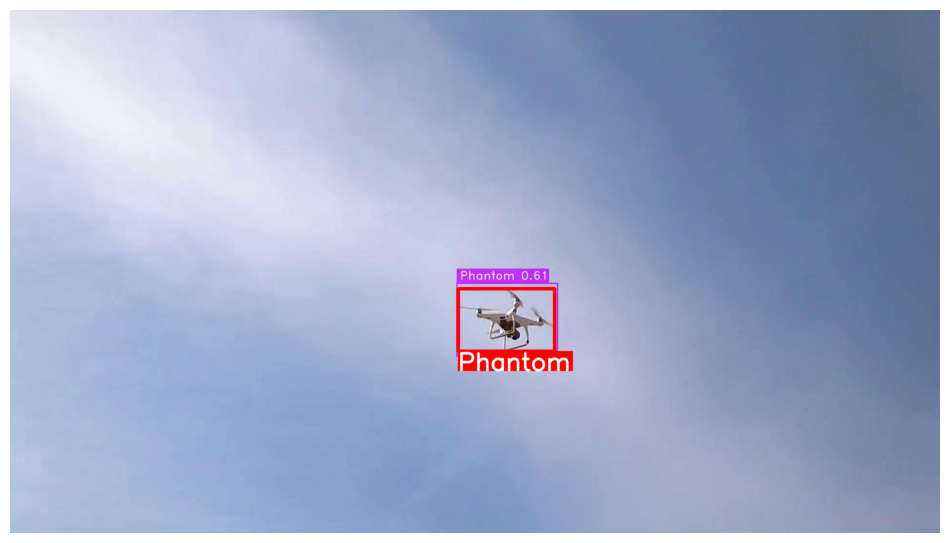

In [ ]:
# Visualize a few training images.
plot(
    image_path='inference_results/images/',
    label_path='/content/drive/MyDrive/yolo-nas/test/labels', #compelete path for you test labels/ annotations
    num_samples=20,
)

### ***E-FLITE***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
